In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time

In [9]:
df1=pd.read_csv("loan_data.csv")
df1.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0


In [10]:
df1 = pd.get_dummies(df1,['purpose'],drop_first=True)
df1 = df1.drop('credit.policy',axis=1)
df1.head()

,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,0,1,0,0,0,0
1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0,1,0,0,0,0,0
2,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,0,1,0,0,0,0
3,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,0,1,0,0,0,0
4,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0,1,0,0,0,0,0


In [11]:
df2=df1.drop('not.fully.paid',axis=1)

In [12]:
from itertools import combinations

In [13]:
lst_vars=list(combinations(df2.columns,2))

In [14]:
len(lst_vars)

136

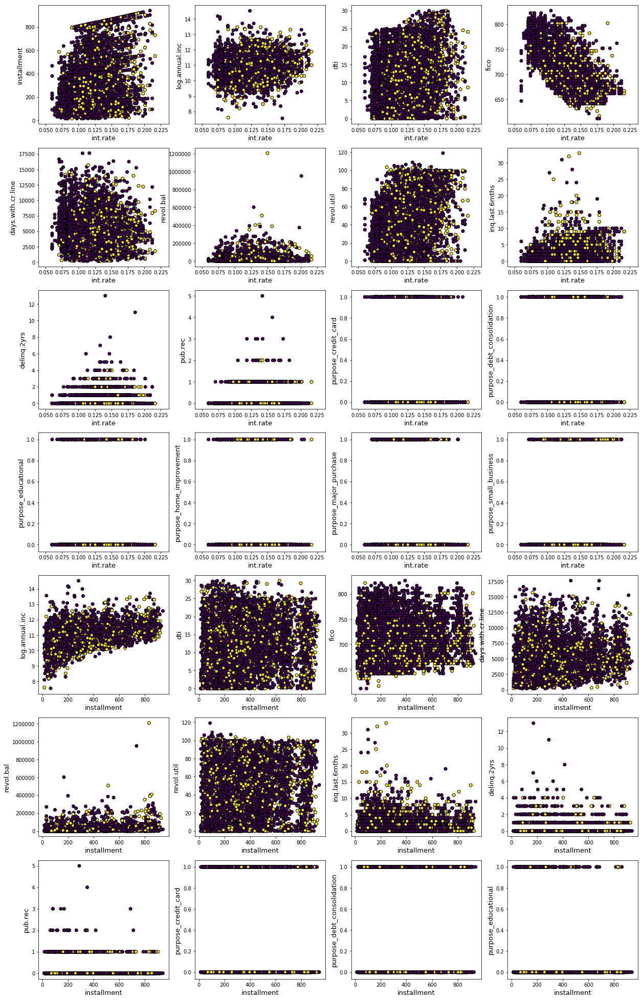

In [15]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df2[dim1],df2[dim2],c=df1['not.fully.paid'],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [17]:
df2.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
int.rate,9578.0,0.122640,0.026847,0.060000,0.103900,0.122100,0.140700,2.164000e-01
installment,9578.0,319.089413,207.071301,15.670000,163.770000,268.950000,432.762500,9.401400e+02
log.annual.inc,9578.0,10.932117,0.614813,7.547502,10.558414,10.928884,11.291293,1.452835e+01
dti,9578.0,12.606679,6.883970,0.000000,7.212500,12.665000,17.950000,2.996000e+01
fico,9578.0,710.846314,37.970537,612.000000,682.000000,707.000000,737.000000,8.270000e+02
days.with.cr.line,9578.0,4560.767197,2496.930377,178.958333,2820.000000,4139.958333,5730.000000,1.763996e+04
revol.bal,9578.0,16913.963876,33756.189557,0.000000,3187.000000,8596.000000,18249.500000,1.207359e+06
revol.util,9578.0,46.799236,29.014417,0.000000,22.600000,46.300000,70.900000,1.190000e+02
inq.last.6mths,9578.0,1.577469,2.200245,0.000000,0.000000,1.000000,2.000000,3.300000e+01
delinq.2yrs,9578.0,0.163708,0.546215,0.000000,0.000000,0.000000,0.000000,1.300000e+01


## k-means clustering

In [18]:
from sklearn.cluster import KMeans

### Unlabled data

In [19]:
X=df2

In [20]:
X.head()

,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_major_purchase,purpose_small_business
0,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0,1,0,0,0,0
1,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,1,0,0,0,0,0
2,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0,1,0,0,0,0
3,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0,1,0,0,0,0
4,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,1,0,0,0,0,0


In [21]:
y=df1['not.fully.paid']

### Scaling

In [22]:
from sklearn.preprocessing import MinMaxScaler

In [23]:
scaler = MinMaxScaler()

In [24]:
X_scaled=scaler.fit_transform(X)

### Metrics

In [25]:
from sklearn.metrics.cluster import adjusted_mutual_info_score

In [26]:
from sklearn.metrics import silhouette_score

In [27]:
from sklearn.metrics import adjusted_rand_score

In [28]:
from sklearn.metrics import completeness_score

In [29]:
from sklearn.metrics.cluster import homogeneity_score

In [30]:
from sklearn.metrics import v_measure_score

### Running k-means and computing inter-cluster distance score for various *k* values

In [31]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,11)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    km_sse.append(-km.score(X_scaled))
    km_silhouette.append(silhouette_score(X_scaled,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10


### Plotting various cluster evaluation metrics as function of number of clusters

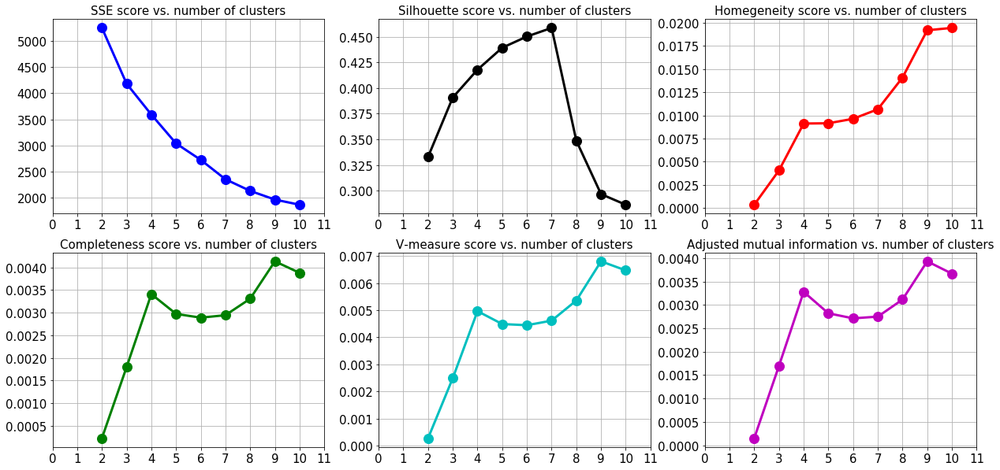

In [33]:
plt.figure(figsize=(21,10))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### Creating the baseline k-means model

In [35]:
t1=time.time()
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)
t2=time.time()
time_km = t2-t1

In [36]:
preds_km = km.predict(X_scaled)

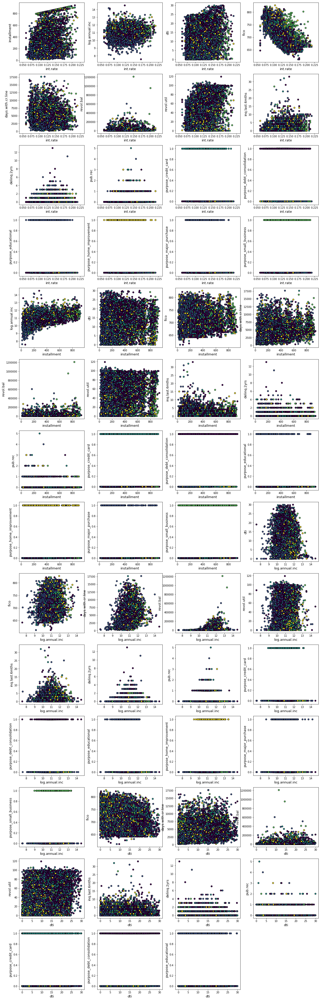

In [37]:
plt.figure(figsize=(21,71))
for i in range(1,56):
    plt.subplot(14,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df2[dim1],df2[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of k-means

In [40]:
time_km = []
for i in range(20):
    t1=time.time()
    km = KMeans(n_clusters=6,n_init=10,max_iter=500).fit(X=X_scaled)
    t2=time.time()
    delta = t2-t1
    time_km.append(delta)
time_km = np.array(time_km)
avg_time_km = time_km.mean()
print(avg_time_km)

0.33625576496124265


## Expectation-maximization (Gaussian Mixture Model)

In [41]:
from sklearn.mixture import GaussianMixture

In [44]:
gm_ll= []
gm_bic = []
gm_aic = []
gm_silhouette = []
gm_vmeasure =[]
gm_ami = []
gm_homogeneity = []
gm_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    gm = GaussianMixture(n_components=i).fit(X_scaled)
    preds = gm.predict(X_scaled)
    gm_ll.append(gm.score(X_scaled))
    gm_bic.append(-gm.bic(X_scaled))
    gm_aic.append(-gm.aic(X_scaled))
    gm_silhouette.append(silhouette_score(X_scaled,preds))
    gm_vmeasure.append(v_measure_score(y,preds))
    gm_ami.append(adjusted_mutual_info_score(y,preds))
    gm_homogeneity.append(homogeneity_score(y,preds))
    gm_completeness.append(completeness_score(y,preds))
    print(f"Done for Gaussian components {i}")


Done for Gaussian components 2
Done for Gaussian components 3
Done for Gaussian components 4
Done for Gaussian components 5
Done for Gaussian components 6
Done for Gaussian components 7
Done for Gaussian components 8
Done for Gaussian components 9
Done for Gaussian components 10
Done for Gaussian components 11


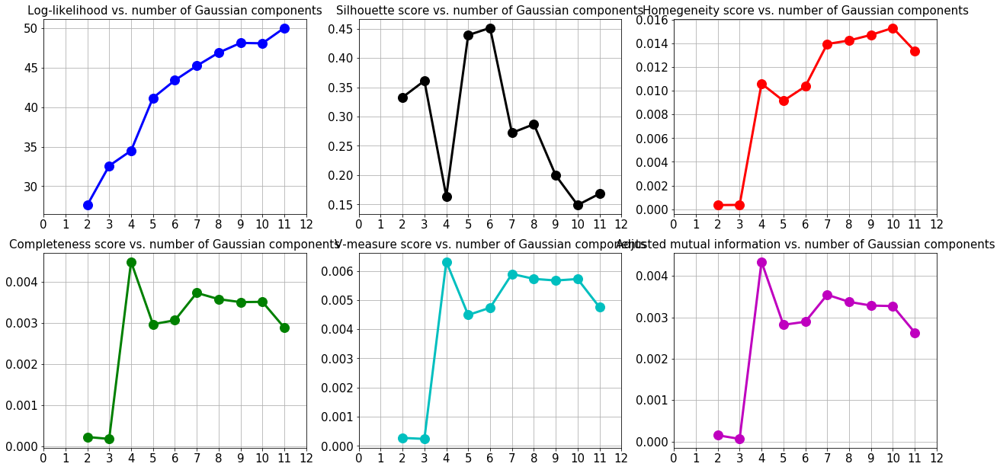

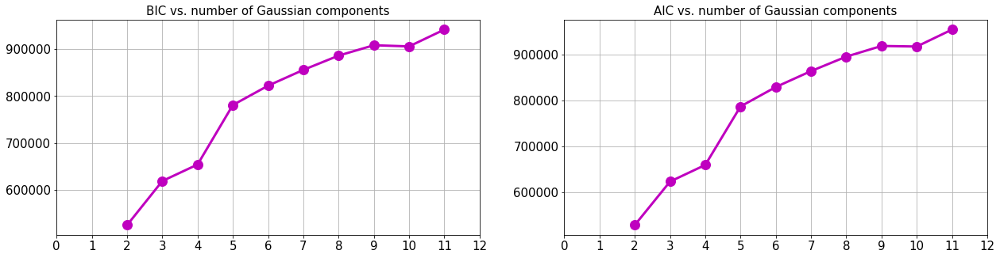

In [45]:
plt.figure(figsize=(21,16))

#SSE
plt.subplot(3,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_ll,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Log-likelihood vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(3,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(3,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(3,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(3,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(3,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

plt.figure(figsize=(21,5))
#BIC
plt.subplot(1,2,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_bic,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("BIC vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#AIC
plt.subplot(1,2,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],gm_aic,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("AIC vs. number of Gaussian components",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### Creating the baseline Gaussian Mixture Model

In [47]:
t1=time.time()
gm = GaussianMixture(n_components=6,verbose=1,n_init=10,tol=1e-5,covariance_type='full',max_iter=500).fit(X_scaled)
t2=time.time()
time_gm = t2-t1

Initialization 0
  Iteration 0
  Iteration 10
Initialization converged: True
Initialization 1
  Iteration 0
  Iteration 10
Initialization converged: True
Initialization 2
  Iteration 0
  Iteration 10
Initialization converged: True
Initialization 3
  Iteration 0
Initialization converged: True
Initialization 4
  Iteration 0
  Iteration 10
  Iteration 20
Initialization converged: True
Initialization 5
  Iteration 0
Initialization converged: True
Initialization 6
  Iteration 0
  Iteration 10
Initialization converged: True
Initialization 7
  Iteration 0
  Iteration 10
Initialization converged: True
Initialization 8
  Iteration 0
  Iteration 10
Initialization converged: True
Initialization 9
  Iteration 0
Initialization converged: True


In [48]:
gm.means_

array([[0.42579921, 0.37136347, 0.48209115, 0.46984185, 0.42730868,
        0.24936022, 0.01420183, 0.45483617, 0.04428669, 0.01255808,
        0.01410159, 0.        , 1.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.38195776, 0.32865395, 0.50133255, 0.4706074 , 0.45407806,
        0.26791407, 0.01919895, 0.45042416, 0.04204485, 0.01164208,
        0.01442155, 1.        , 0.        , 0.        , 0.        ,
        0.        , 0.        ],
       [0.3463615 , 0.24642651, 0.47234826, 0.33911501, 0.51396945,
        0.23750133, 0.00603089, 0.27275542, 0.04736149, 0.01337793,
        0.00961098, 0.        , 0.        , 0.        , 0.        ,
        1.        , 0.        ],
       [0.36768874, 0.34766038, 0.52350008, 0.34037063, 0.52467926,
        0.2876718 , 0.01435261, 0.28802207, 0.05882353, 0.0105173 ,
        0.01335453, 0.        , 0.        , 0.        , 1.        ,
        0.        , 0.        ],
       [0.49927798, 0.45232036, 0.51551217, 0.360256

In [49]:
km.cluster_centers_

array([[ 4.99277979e-01,  4.52320365e-01,  5.15512173e-01,
         3.60256864e-01,  5.02272983e-01,  2.69924829e-01,
         2.28442440e-02,  3.36726355e-01,  5.85989132e-02,
         1.19299118e-02,  1.13085622e-02, -1.11022302e-16,
         4.16333634e-15, -3.74700271e-16,  3.74700271e-16,
        -4.92661467e-16,  1.00000000e+00],
       [ 3.65555544e-01,  2.44198428e-01,  4.66980988e-01,
         3.70946103e-01,  4.76457185e-01,  2.34457772e-01,
         1.04521940e-02,  3.32734832e-01,  5.07014800e-02,
         1.36068120e-02,  9.49887809e-03, -4.10782519e-15,
        -2.88657986e-15,  1.28272251e-01,  7.77156117e-16,
         1.50573998e-15, -1.26287869e-15],
       [ 4.25799208e-01,  3.71363473e-01,  4.82091150e-01,
         4.69841855e-01,  4.27308685e-01,  2.49360220e-01,
         1.42018328e-02,  4.54836169e-01,  4.42866880e-02,
         1.25580762e-02,  1.41015921e-02, -4.49640325e-15,
         1.00000000e+00, -5.96744876e-16,  3.88578059e-16,
         1.74860126e-15, -3.9

In [50]:
gm.means_/km.cluster_centers_

array([[ 8.52829939e-01,  8.21018689e-01,  9.35169286e-01,
         1.30418571e+00,  8.50749888e-01,  9.23813570e-01,
         6.21681016e-01,  1.35075905e+00,  7.55759545e-01,
         1.05265458e+00,  1.24698365e+00, -0.00000000e+00,
         2.40191980e+14, -0.00000000e+00,  0.00000000e+00,
        -0.00000000e+00,  0.00000000e+00],
       [ 1.04486928e+00,  1.34584791e+00,  1.07356093e+00,
         1.26866787e+00,  9.53030145e-01,  1.14269648e+00,
         1.83683410e+00,  1.35370307e+00,  8.29262858e-01,
         8.55606893e-01,  1.51823752e+00, -2.43437818e+14,
        -0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00, -0.00000000e+00],
       [ 8.13438566e-01,  6.63572282e-01,  9.79790362e-01,
         7.21764148e-01,  1.20280601e+00,  9.52442746e-01,
         4.24655973e-01,  5.99678381e-01,  1.06942941e+00,
         1.06528470e+00,  6.81553111e-01, -0.00000000e+00,
         0.00000000e+00, -0.00000000e+00,  0.00000000e+00,
         5.71885667e+14, -0.0

In [51]:
preds_gm=gm.predict(X_scaled)

In [52]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [53]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [54]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 0.0066244440124761965
Adjusted Rand score for Gaussian Mixture model 0.004427077368008813


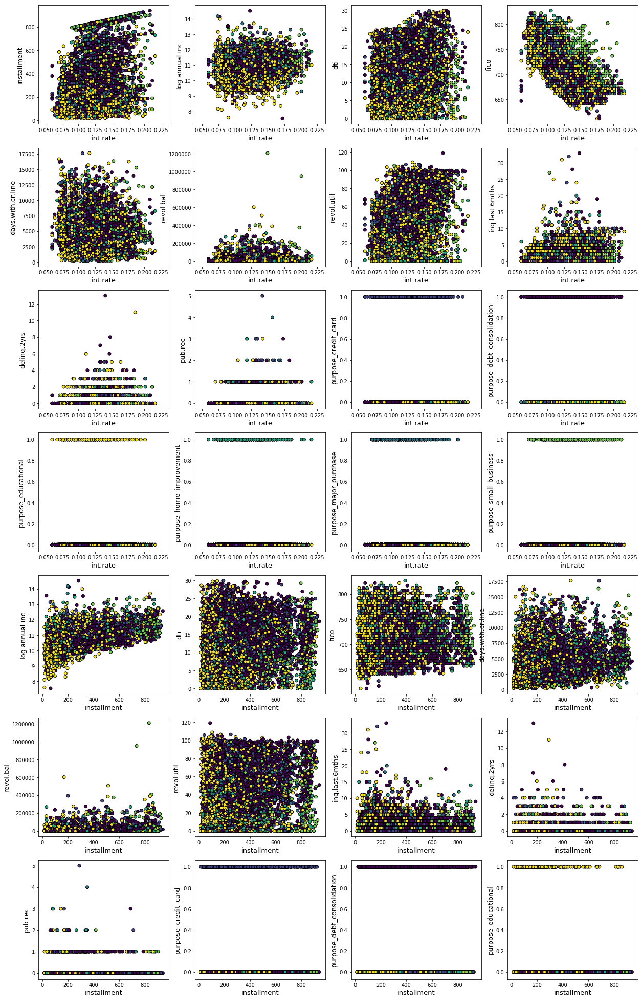

In [55]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of Gaussian Mixture Model

In [57]:
time_gm = []
for i in range(10):
    t1=time.time()
    gm = GaussianMixture(n_components=6,n_init=10,tol=1e-5,
                         covariance_type='full',max_iter=500).fit(X_scaled)
    t2= time.time()
    delta = t2-t1
    time_gm.append(delta)
time_gm = np.array(time_gm)
avg_time_gm = time_gm.mean()
print(avg_time_gm)

5.32019739151001


## PCA

In [58]:
from sklearn.decomposition import PCA

In [59]:
n_prin_comp = 5

In [60]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

In [61]:
pca_full = PCA(n_components=11,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=11, random_state=None,
  svd_solver='full', tol=0.0, whiten=False)

### Eigenvalues

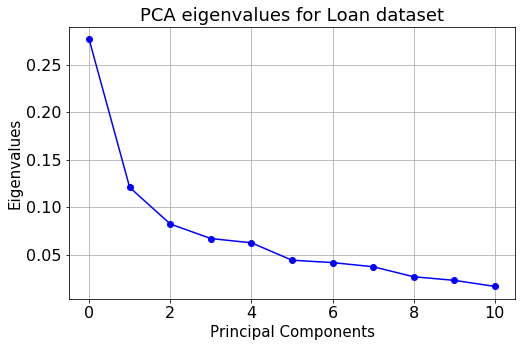

In [106]:
plt.figure(figsize=(8,5))
plt.title("PCA eigenvalues for Loan dataset", fontsize=18)
plt.plot(pca_full.explained_variance_,'b-o')
plt.grid(True)
plt.xticks(fontsize=16)
plt.xlabel("Principal Components",fontsize=15)
plt.yticks(fontsize=16)
plt.ylabel("Eigenvalues",fontsize=15)
plt.show()

### How much variance is explained by principal components?

In [62]:
pca_explained_var = pca_full.explained_variance_ratio_

In [63]:
cum_explaiend_var = pca_explained_var.cumsum()

In [64]:
cum_explaiend_var

array([0.33835481, 0.48599537, 0.58655369, 0.66841218, 0.74474625,
       0.798709  , 0.84957275, 0.89510691, 0.92772571, 0.95572259,
       0.97588551])

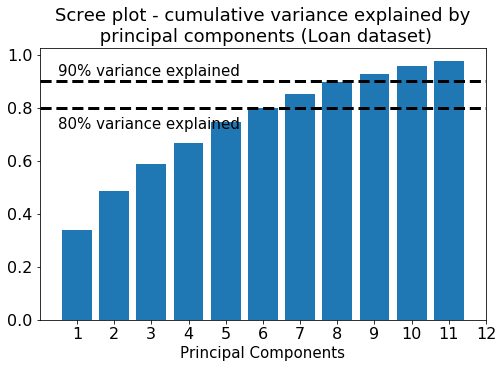

In [113]:
plt.figure(figsize=(8,5))
plt.title("Scree plot - cumulative variance explained by\n principal components (Loan dataset)", fontsize=18)
plt.bar(range(1,12),cum_explaiend_var)
plt.xticks([i for i in range(1,13)],fontsize=16)
plt.xlabel("Principal Components",fontsize=15)
plt.yticks(fontsize=16)
plt.xlim(0,12)
plt.hlines(y=0.8,xmin=0,xmax=12,linestyles='dashed',lw=3)
plt.text(x=0.5,y=0.72,s="80% variance explained",fontsize=15)
plt.hlines(y=0.9,xmin=0,xmax=12,linestyles='dashed',lw=3)
plt.text(x=0.5,y=0.92,s="90% variance explained",fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [66]:
X_pca = pca_partial.fit_transform(X_scaled)

In [67]:
df_pca=pd.DataFrame(data=X_pca,columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running k-means on the transformed features

In [68]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    km_sse.append(-km.score(X_pca))
    km_silhouette.append(silhouette_score(X_pca,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


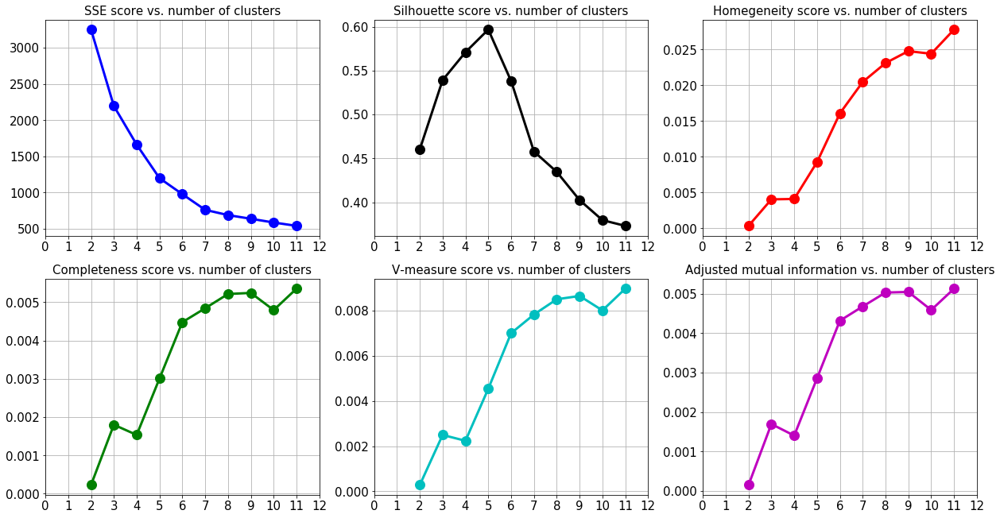

In [69]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### K-means fitting with PCA-transformed data

In [90]:
t1=time.time()
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
t2=time.time()
time_km_pca = t2-t1
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running k-means on PCA-transformed features

In [91]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

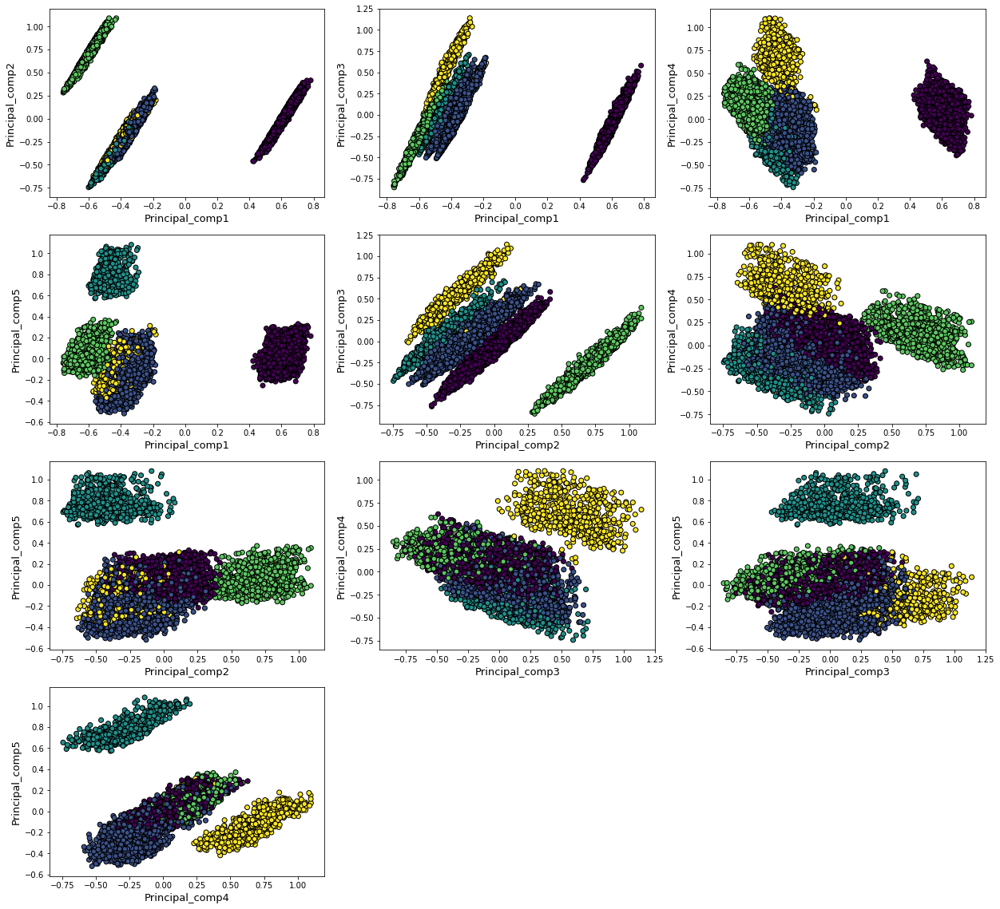

In [92]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of k-means with PCA

In [93]:
time_km_pca = []
for i in range(10):
    t1=time.time()
    km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
    t2= time.time()
    delta = t2-t1
    time_km_pca.append(delta)
time_km_pca = np.array(time_km_pca)
avg_time_km_pca = time_km_pca.mean()
print(avg_time_km_pca)

0.16719820499420165


## ICA

In [118]:
from sklearn.decomposition import FastICA

In [119]:
n_ind_comp = 5

In [120]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
    n_components=5, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [121]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
    n_components=None, random_state=None, tol=0.0001, w_init=None,
    whiten=True)

In [122]:
X_ica = ica_partial.fit_transform(X_scaled)

In [123]:
df_ica=pd.DataFrame(data=X_ica,columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Kurtosis

In [124]:
from scipy.stats import kurtosis

In [125]:
X_ica_full = ica_full.fit_transform(X_scaled)

In [126]:
kurt = kurtosis(X_ica_full,fisher=True)

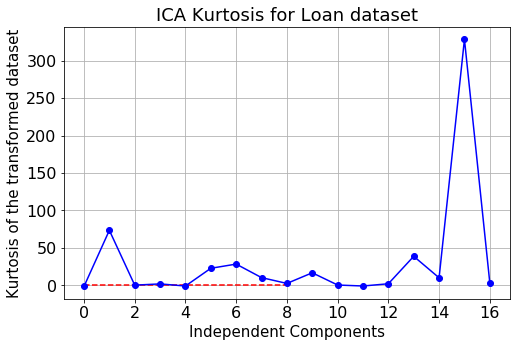

In [127]:
plt.figure(figsize=(8,5))
plt.title("ICA Kurtosis for Loan dataset", fontsize=18)
plt.plot(kurt,'b-o')
plt.grid(True)
plt.xticks(fontsize=16)
plt.xlabel("Independent Components",fontsize=15)
plt.yticks(fontsize=16)
plt.ylabel("Kurtosis of the transformed dataset",fontsize=15)
plt.hlines(y = 0, xmin=0, xmax=8,colors='red',linestyles='dashed')
plt.show()

### Running k-means on the independent features

In [81]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    km_sse.append(-km.score(X_ica))
    km_silhouette.append(silhouette_score(X_ica,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


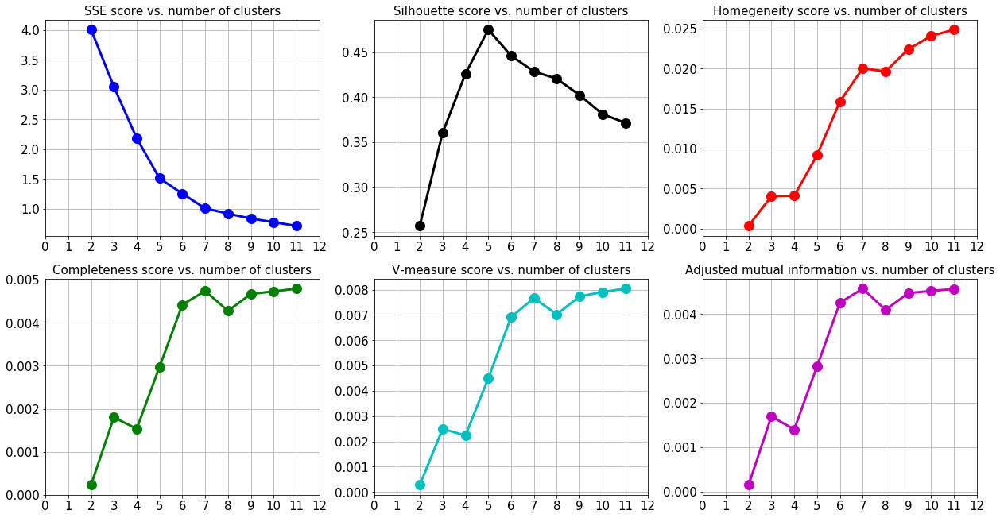

In [82]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### K-means fitting with ICA-transformed data

In [87]:
t1=time.time()
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
t2=time.time()
time_km_ica = t2-t1

# Predictions
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running k-means on ICA-transformed features

In [88]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

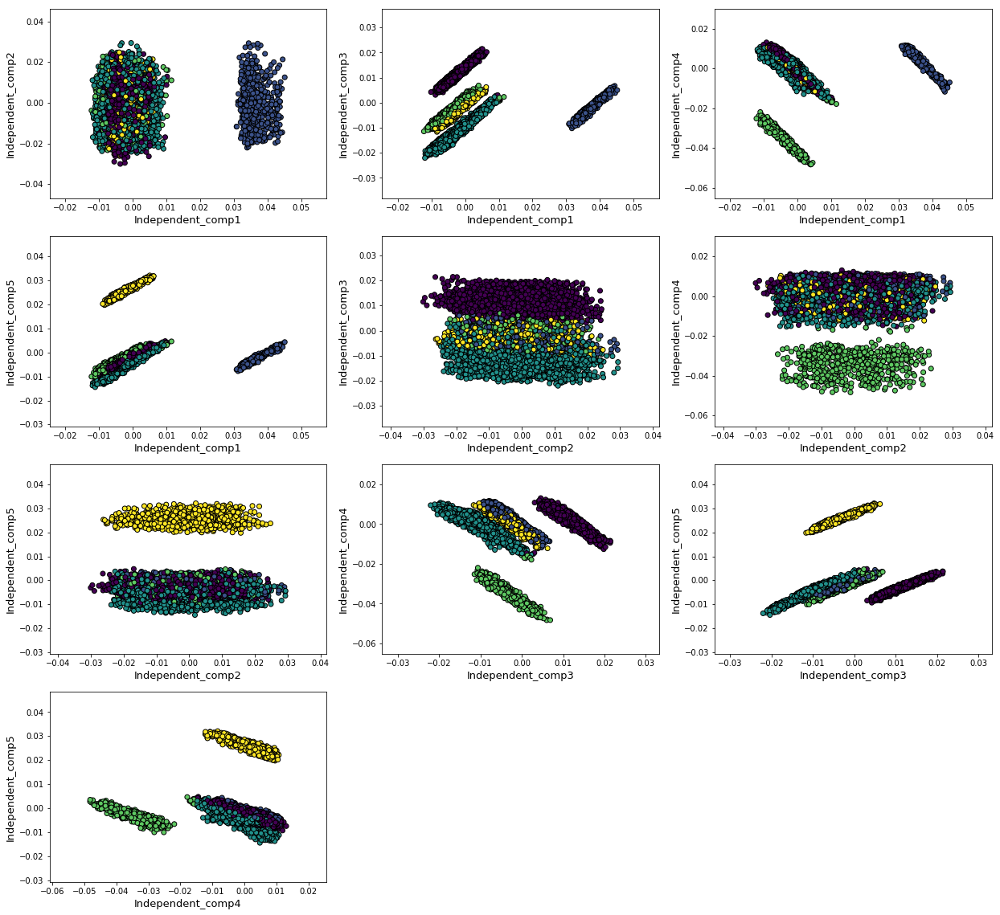

In [89]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

### Estimating average running time of k-means with ICA

In [86]:
time_km_ica = []
for i in range(10):
    t1=time.time()
    km_ica = KMeans(n_clusters=6,n_init=10,max_iter=500).fit(X=X_ica)
    t2= time.time()
    delta = t2-t1
    time_km_ica.append(delta)
time_km_ica = np.array(time_km_ica)
avg_time_km_ica = time_km_ica.mean()
print(avg_time_km_ica)

0.22038729190826417


## Random Projection

In [94]:
from sklearn.random_projection import GaussianRandomProjection

In [95]:
n_random_comp = 5

In [96]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [97]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [98]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running k-means on random projections

In [99]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    km_sse.append(-km.score(X_random_proj))
    km_silhouette.append(silhouette_score(X_random_proj,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

Done for cluster 2
Done for cluster 3
Done for cluster 4
Done for cluster 5
Done for cluster 6
Done for cluster 7
Done for cluster 8
Done for cluster 9
Done for cluster 10
Done for cluster 11


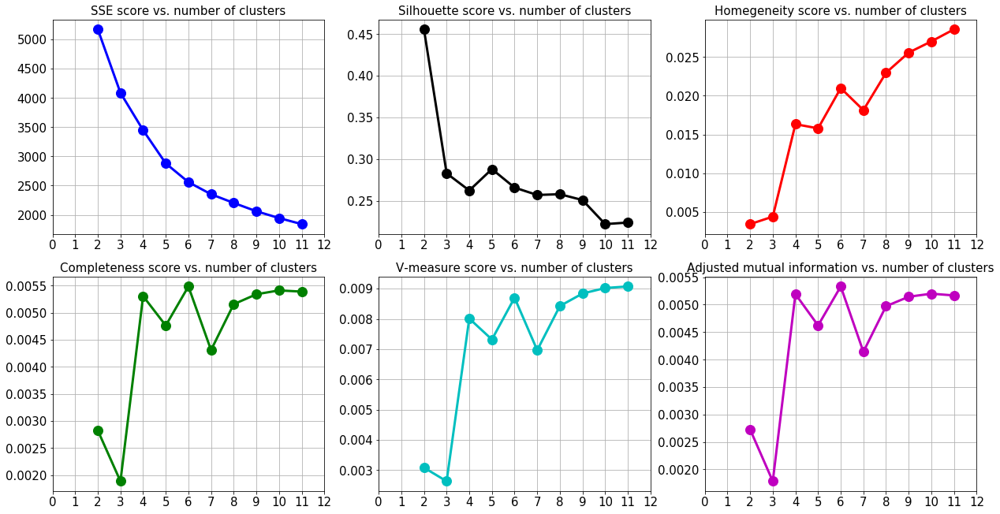

In [100]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()

### K-means fitting with random-projected data

In [101]:
t1=time.time()
km_random_proj = KMeans(n_clusters=6,n_init=10,max_iter=500).fit(X=X_random_proj)
t2=time.time()
time_km_rp = t2-t1
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running k-means on random-projected features

In [102]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

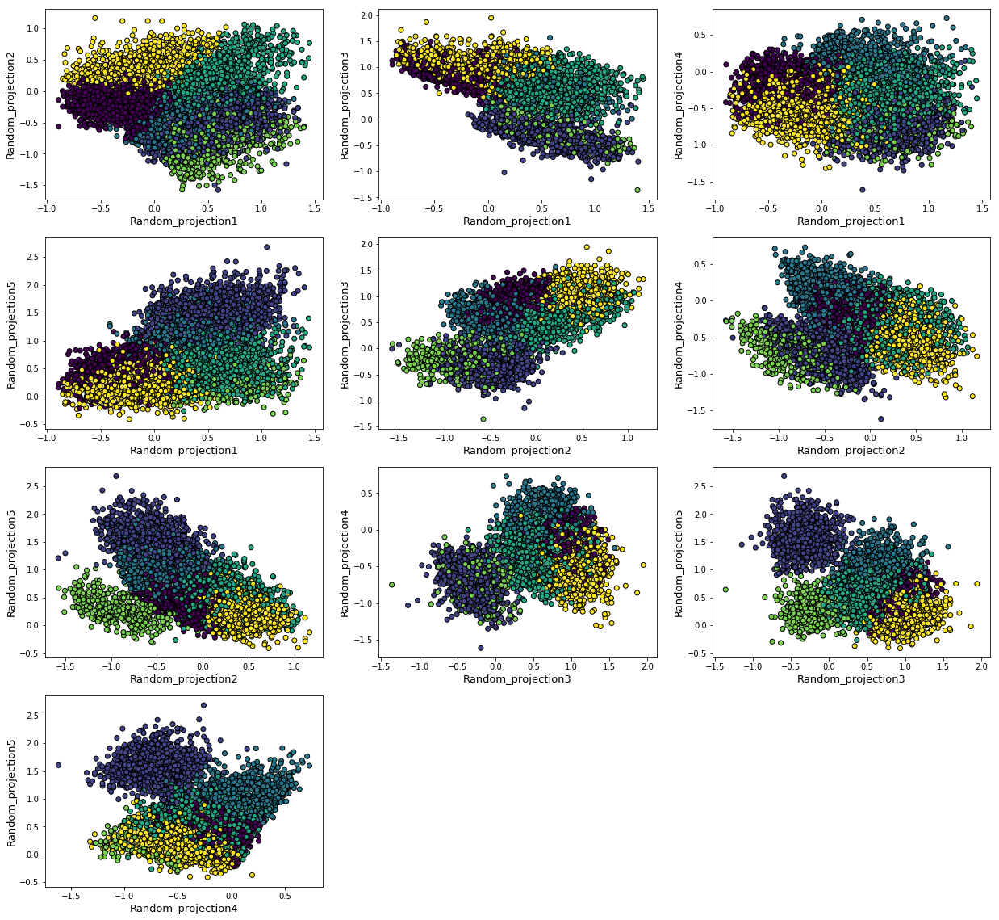

In [103]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

### Estimating average running time of k-means with random projections

In [104]:
time_km_rp = []
for i in range(10):
    t1=time.time()
    km_rp = KMeans(n_clusters=6,n_init=10,max_iter=500).fit(X=X_random_proj)
    t2= time.time()
    delta = t2-t1
    time_km_rp.append(delta)
time_km_rp = np.array(time_km_rp)
avg_time_km_rp = time_km_rp.mean()
print(avg_time_km_rp)

0.9013517141342163


In [ ]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

In [ ]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    #plot_cluster_rp(df_random_proj,preds)

In [ ]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

In [ ]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

In [ ]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [ ]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

### Testing cluster accuracy function

In [ ]:
def cluster_acc(Y,clusterLabels):
    import numpy as np
    from collections import Counter
    from sklearn.metrics import accuracy_score as acc
    assert (Y.shape == clusterLabels.shape)
    pred = np.empty_like(Y)
    for label in set(clusterLabels):
        mask = clusterLabels == label
        sub = Y[mask]
        target = Counter(sub).most_common(1)[0][0]
        pred[mask] = target
#    assert max(pred) == max(Y)
#    assert min(pred) == min(Y)    
    return acc(Y,pred)

In [ ]:
adjusted_rand_score(y,preds_gm)

In [ ]:
adjusted_rand_score(y,preds_km)

In [ ]:
adjusted_rand_score(y,preds_km_pca)

In [ ]:
adjusted_rand_score(y,preds_km_ica)

In [ ]:
adjusted_rand_score(y,preds_km_random_proj)

## Feature selection

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel

print(X_scaled.shape)

clf = RandomForestClassifier(n_estimators=100,max_depth=3)
clf = clf.fit(X_scaled, y)
clf.feature_importances_  

model = SelectFromModel(clf, prefit=True)
X_fs = model.transform(X_scaled)

print(X_new.shape)

### Running k-means on new transformed dataset after feature selection

In [ ]:
km_sse= []
km_silhouette = []
km_vmeasure =[]
km_ami = []
km_homogeneity = []
km_completeness = []

cluster_range = (2,12)

for i in range(cluster_range[0],cluster_range[1]):
    km = KMeans(n_clusters=i, random_state=0).fit(X_fs)
    preds = km.predict(X_fs)
    km_sse.append(-km.score(X_fs))
    km_silhouette.append(silhouette_score(X_fs,preds))
    km_vmeasure.append(v_measure_score(y,preds))
    km_ami.append(adjusted_mutual_info_score(y,preds))
    km_homogeneity.append(homogeneity_score(y,preds))
    km_completeness.append(completeness_score(y,preds))
    print(f"Done for cluster {i}")

In [ ]:
plt.figure(figsize=(21,11))

#SSE
plt.subplot(2,3,1)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_sse,'b-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("SSE score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Silhouette
plt.subplot(2,3,2)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_silhouette,'k-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Silhouette score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Homegeneity
plt.subplot(2,3,3)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_homogeneity,'r-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Homegeneity score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Completeness
plt.subplot(2,3,4)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_completeness,'g-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Completeness score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#V-measure
plt.subplot(2,3,5)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_vmeasure,'c-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("V-measure score vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

#Adjusted mutual information
plt.subplot(2,3,6)
plt.plot([i for i in range(cluster_range[0],cluster_range[1])],km_ami,'m-o',linewidth=3,markersize=12)
plt.grid(True)
plt.title("Adjusted mutual information vs. number of clusters",fontsize=15)
plt.xticks([i for i in range(0,cluster_range[1]+1,1)],fontsize=15)
plt.yticks(fontsize=15)

plt.show()